# Fourier Operations with pixell

*Written by the ACT Collaboration*

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/simonsobs/pixell_tutorials/pixell_fourier_space_operations.ipynb)


---

This notebook, and the accompanying notebooks included in this set, are designed to help users who are new to working with [`pixell`](https://github.com/simonsobs/pixell/) get started with the package. As a set these notebooks will guide users through examples of how to read in and display maps, how to perform spherical harmonic transform and calculate simple spectra, how to transform the maps and how to study point sources in the maps.

The `pixell` library allows users to load,
manipulate and analyze maps stored in rectangular pixelization. It is
mainly targeted for use with maps of the sky (e.g. CMB intensity and polarization maps, stacks of 21 cm intensity maps, binned galaxy positions or shear) in cylindrical projection.


In this notebook, we walk through common Fourier-space operations in `pixell`. A similar set of exercises is available in [this](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/blob/master/Notebooks/Section_7_power_spectra_part_1.ipynb) ACT DR4/DR5 notebook.

In [ ]:
# Download the data needed for the notebook
!wget -O act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits https://phy-act1.princeton.edu/public/zatkins/act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits

--2024-07-18 03:33:14--  https://phy-act1.princeton.edu/public/zatkins/act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109195200 (104M) [image/fits]
Saving to: ‘act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits’

act_planck_dr5.01_s 100%[===================>] 104.14M  12.6MB/s    in 9.9s    

2024-07-18 03:33:24 (10.6 MB/s) - ‘act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits’ saved [109195200/109195200]



In [ ]:
# Install neccesary packages
!pip install pixell

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.8/233.8 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=011957e139998f1354350500c93886b6b1a60ecc1a759dff9132e2a7c1b4a8e9
  Stored in directory: /root/.cache/pip/wheels/fc/ab/d4/5da2067ac95b36618c629a5f93f809425700506f72c9732fac
Successfully built docopt


In this notebook, we will again work with a (cutout of) the ACT DR5+Planck coadd map, in the "deep 56" region. We import the `enmap` module as before, which has most of what we'll need, but we'll also take a peak under-the-hood at some low-level Fourier transform-related code in the `fft` module. Let's import packages and take a look at the map:

In [ ]:
# Import packages
from pixell import enmap, fft, enplot
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Code to read and plot maps
imap = enmap.read_map("act_planck_dr5.01_s08s18_AA_f150_night_map_d56.fits")

print(imap.geometry, imap.dtype)

((3, 1416, 6426), car:{cdelt:[-0.008333,0.008333],crval:[15.47,0],crpix:[3397.00,906.00]}) float32


We see there are 3 components in this data. Following convention, this means this map is *polarized*, with intensity (I), and polarization (Q and U). Let's plot the polarized components. Do this in a for loop over components so that the colorbar is automatically adjusted for each component separately:

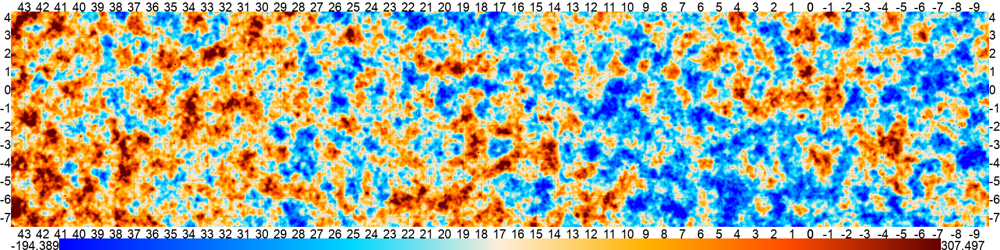

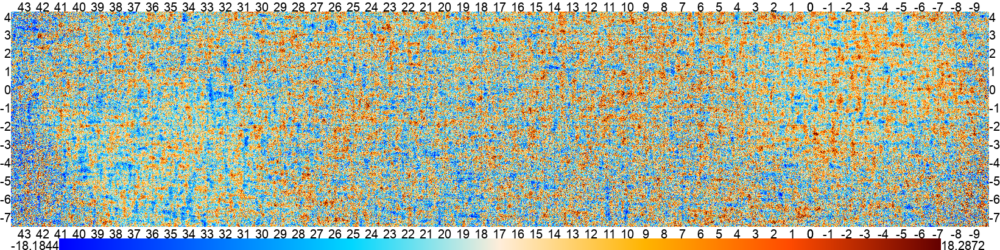

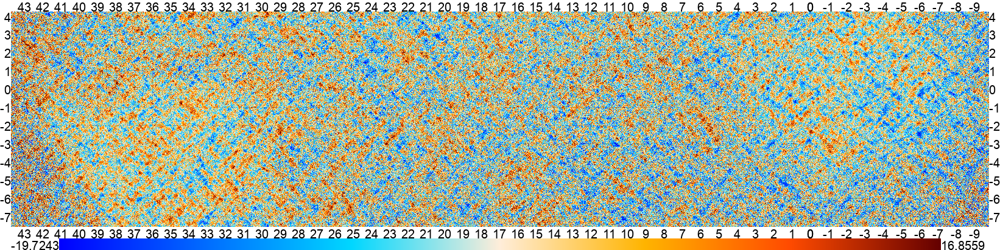

In [ ]:
for i in range(3):
  enplot.pshow(imap[i], downgrade=4, colorbar=True)

Cool! We saw the intensity map in a previous notebook. What interests you about the polarization components, Q and U? Anyway, we'll get to them later and deal with intensity only for now:

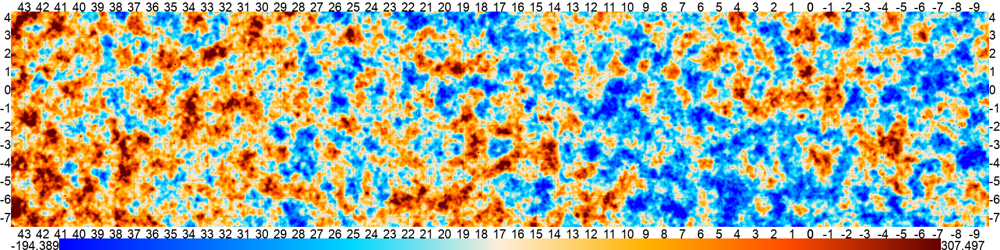

In [ ]:
imap_I = imap[0] # get the intensity component of the map for now

enplot.pshow(imap_I, downgrade=4, colorbar=True)

By now, you should have a little experience with fourier transforms, especially 2d transforms, on numpy arrays (if not, you should refresh yourself by walking through [this CMB school notebook](https://github.com/jeffmcm1977/CMBAnalysis_SummerSchool/blob/master/CMB_School_FFT_intro.ipynb)). Remember, an `ndmap` is just a numpy array with a `wcs` object attached! So everything we learned there about conventions carries over here.

`pixell` has its own Fourier-transform functions that we'll want to use instead of numpy's. One reason is that it will preserve the `wcs`, but also because `pixell` makes available some additional features that will be useful to us as cosmologists.

Let's start by taking a simple 2d fft. It is commonly the case that we will have a map that has some "hard edge" or is does not have continuous boundary conditions like a fullsky map does. In this case, it is very important that we "apodize" the map by applying a smooth taper to it, to give it continuous boundary conditions:

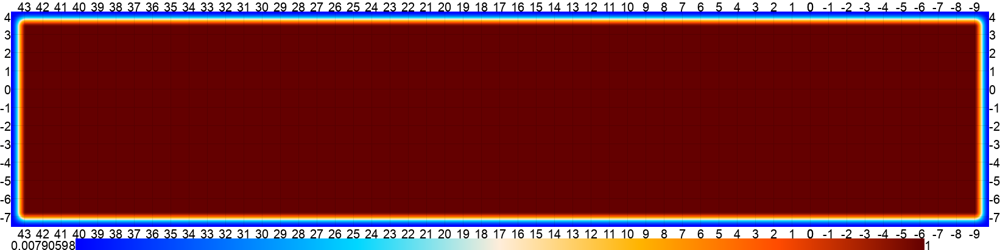

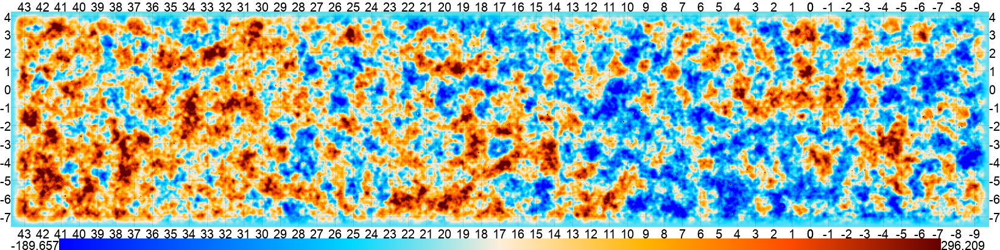

In [ ]:
# get an apodized mask that smoothly tapers the edge of the map
# we use a taper width of 100 pixels -- what is the size of that in
# arcminutes?
taper_mask = enmap.apod(enmap.ones(imap_I.shape, imap_I.wcs), width=100)

enplot.pshow(taper_mask, downgrade=4, colorbar=True)

# we can also taper the map we want directly
imap_I_apod = imap_I.apod(width=100)

enplot.pshow(imap_I_apod, downgrade=4, colorbar=True)

Now take the fft:

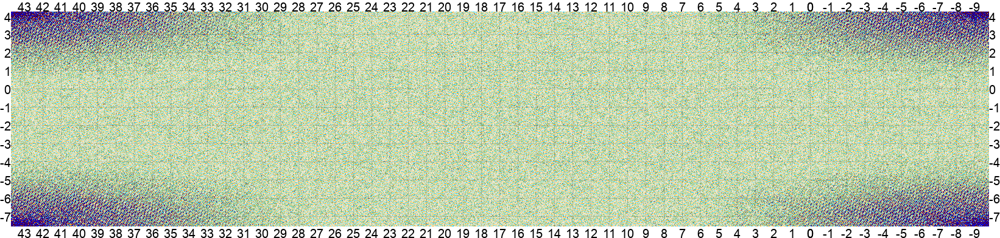

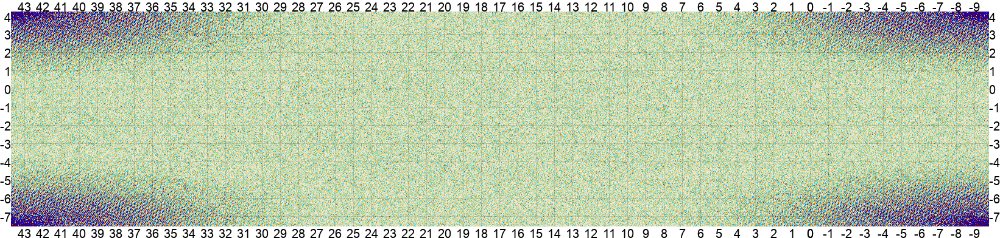

In [ ]:
# Take a simple fourier transform first.
# normalize='phys' means the fft normalization accounts for the
# physical pixel size, unlike numpy which just normalizes by the
# number of pixels. this is one of pixell's key features for
# cosmology vs numpy!
kmap = enmap.fft(imap_I_apod, normalize='phys')

# remember, fft's have real and imaginary components
enplot.pshow(kmap.real, downgrade=4)
enplot.pshow(kmap.imag, downgrade=4)

There are a couple things here which don't make immediate sense with the 2d fft.

First: it looks like all the "action" is in the corners of Fourier space. Remember, this was a quirk of the numpy fft convention! Low frequency modes are at the edges of the Fourier transform, and high frequency modes are in the middle. We can make sense of this using `pixell`. Let's first make a plot of the 2d Fourier coordinates themselves:

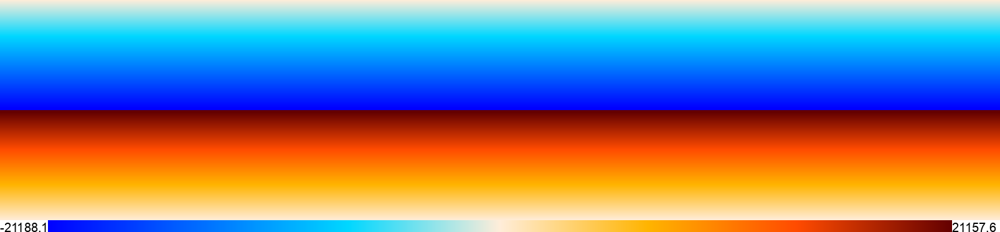

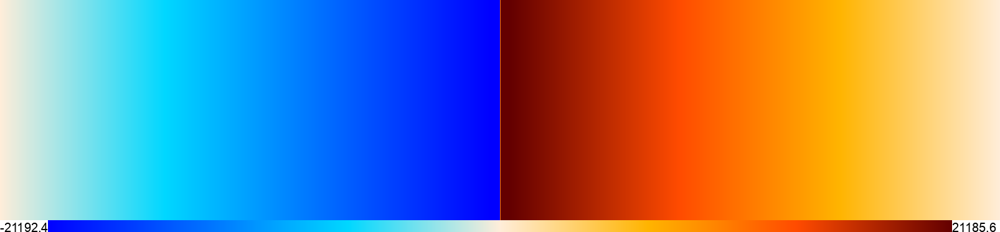

In [ ]:
# get the coordinates of the map in Fourier space
ly, lx = imap.lmap()

enplot.pshow(ly, downgrade=4, colorbar=True, grid=False)
enplot.pshow(lx, downgrade=4, colorbar=True, grid=False)

The first map is the "y" Fourier component; it varies as you move up and down but not left and right. The second map is the "x" component; it varies as you move left and right but not up and down. The "origin" -- the (0, 0) coordinate -- of Fourier space is in the corner, just like in the CMB school FFT notebook, and the biggest value is in the middle. We can use `pixell` to make a map of the distance from 0 in Fourier space too. Bigger numbers mean *smaller* angular scales, and smaller numbers mean *larger* angular scales:

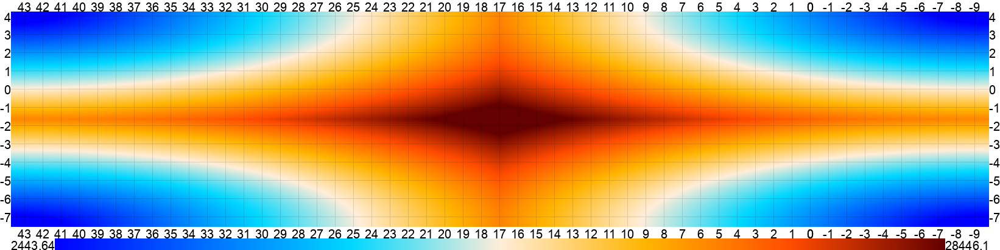

In [ ]:
# this is equivalent to sqrt(lx**2 + ly**2)
modl = imap.modlmap()

enplot.pshow(modl, downgrade=4, colorbar=True)

Second, we are in Fourier space: what's the deal with the gridlines? They are the same as the original map -- telling us about dec and RA -- but Fourier space is, well, not map space! This is because `enmap.fft` preserves the `wcs` of the input. Mainly as a plotting convenience, we can get the "`wcs`" of Fourier space too, so that the gridlines correspond to Fourier modes. We can also do the "fftshift" so that the origin of Fourier space gets shifted to the map center. Both of these features are really most convenient for plotting, we don't really need to worry about this so long as we respect the numpy convention:

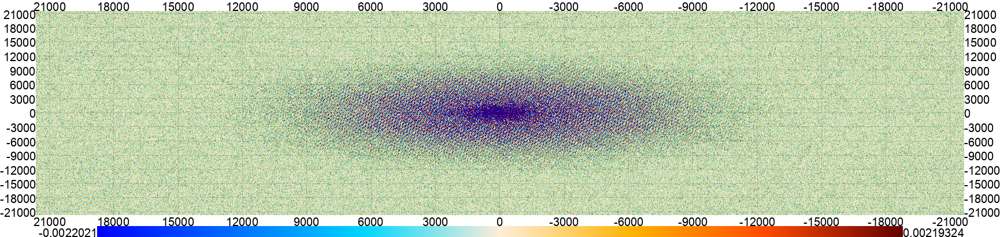

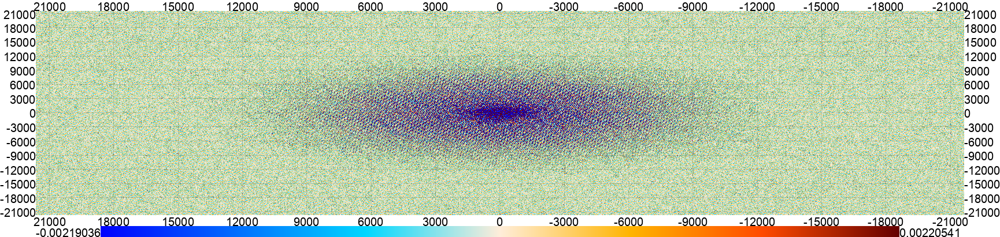

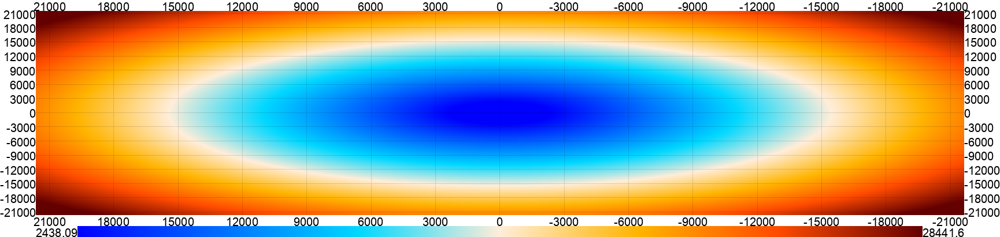

In [ ]:
kwcs = enmap.lwcs(kmap.shape, kmap.wcs)

# reassign the wcs of kmap to be kwcs
kmap_for_plotting = enmap.ndmap(kmap, kwcs)
kmap_for_plotting = enmap.fftshift(kmap_for_plotting)

modl_for_plotting = enmap.ndmap(modl, kwcs)
modl_for_plotting = enmap.fftshift(modl_for_plotting)

enplot.pshow(kmap_for_plotting.real, downgrade=4, colorbar=True, ticks=3000)
enplot.pshow(kmap_for_plotting.imag, downgrade=4, colorbar=True, ticks=3000)
enplot.pshow(modl_for_plotting, downgrade=4, colorbar=True, ticks=3000)

So most of the information in the ACT DR5 maps -- where the big noisy blue and red blob is in the first two plots -- corresponds to large angular scales -- small numbers in the 3rd map.

## Power spectrum

Let's use `pixell` to make a power spectrum. A power spectrum tells us "how pronounced features in the map are as a function of their size."

We will bin the power of the Fourier transformed CMB map (the squared amplitude) in rings of constant angular scales. For this we can use the `enmap.lbin` function:

In [ ]:
power_spectrum, ell_b = enmap.lbin(abs(kmap)**2, bsize=40) # bin width of 40 in ell

# The taper we applied earlier affects the power spectrum.
# Pixell can't fully account for how the taper modifies the power spectrum
# But we can get an approximate correction by dividing out the following term
w2 = np.mean(taper_mask**2)
power_spectrum /= w2

(100.0, 10000.0)

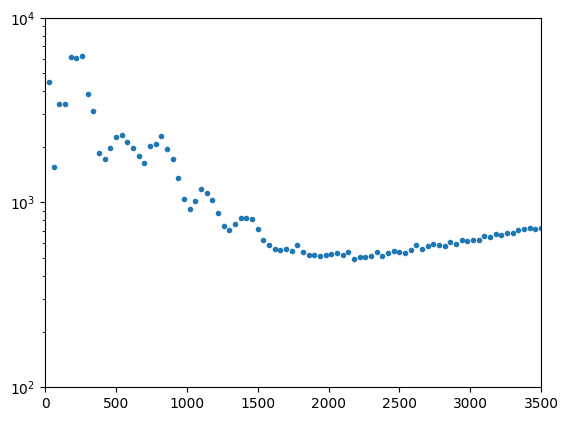

In [ ]:
# the ell*(ell+1)/2pi factor is just another cosmology convention
plt.semilogy(ell_b, power_spectrum * ell_b*(ell_b+1) / 2 / np.pi, marker='.', ls='none')
plt.xlim(0, 3500)
plt.ylim(1e2, 1e4)

Cool! This means that as the Fourier coordinates get farther from 0 -- as we move from *larger to smaller angular scales in the map* -- generally the amount of features goes down. Large scale features are more pronounced than small scale features. Does this seem true when you look back at the plots at the beginning of the notebook? What else stands out about the power spectrum from scales of ~0 to ~1500?

At a certain point, around 1500, the power spectrum turns upwards again -- what does this mean? What could be driving that feature?

## Polarization

What about the Q and U maps? We need a special kind of Fourier transform to understand their cosmological information. Once we get their Fourier transforms, we need to turn their Q and U modes into what are called "E" and "B" modes. You can explore more about the relationship between Q, U, E, and B in [this notebook](https://github.com/jeffmcm1977/CMBAnalysis_SummerSchool/blob/master/CMB_School_Part_07.ipynb).

Fortunately, `pixell` does that for us. Instead of using `enmap.fft`, we'll use a different function:

In [ ]:
imap_apod = imap.apod(width=100)

# use enmap.map2harm
kmap_polarized = enmap.map2harm(imap_apod, normalize='phys')

# now we have a *polarized* Fourier transform, check out the shape
print(kmap_polarized.shape)

# we can get the power spectrum of each polarization
# intensity will be the same, but we will also get E*E and B*B
power_spectra = []
for i in range(3):
  power_spectrum, ell_b = enmap.lbin(abs(kmap_polarized[i])**2, bsize=40)
  power_spectra.append(power_spectrum)

(3, 1416, 6426)


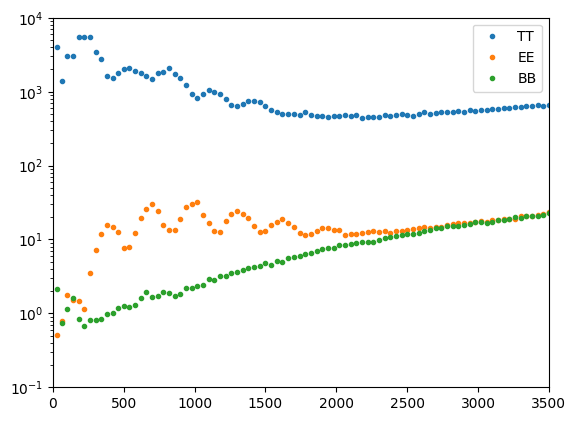

In [ ]:
for i in range(3):
  plt.semilogy(ell_b, power_spectra[i] * ell_b*(ell_b+1) / 2 / np.pi, marker='.', ls='none', label=['TT', 'EE', 'BB'][i])
plt.xlim(0, 3500)
plt.ylim(1e-1, 1e4)
plt.legend()

The blue line is the same as the first power spectrum plot we made. What do you notice about the EE and BB power spectra?

## Exercise

In ACT, we often remove some Fourier modes from the maps -- ie, set their values to 0 -- before calculating the power spectrum. In particular, we set the Fourier modes where |lx| < 90 and |ly| < 50 to 0. This is because we think these modes are contaminated by picking up the signal from the ground near the telescope.

Adapt the code above to do this, and remeasure the polarized power spectra. Does the way they have changed make sense? Can you write more code that will correct for the change?